# FOV Registration over Multiple Days

Progress Report 
Sept. 2019

In [657]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
import pickle as pkl
import itertools as it
from matplotlib import colors as mcolors
from IPython.core.display import display, HTML
from ipywidgets import IntProgress
import caiman as cm
import sys
from multiprocessing import Pool
import multiprocessing
from functools import partial
import pystackreg
from skimage import io
from PIL import Image
display(HTML("<style>.container { width:100% !important; }</style>"))
sns.set_palette('colorblind')
sys.path.append('/mnt/sdb1/gwdgCloud/workspaces/CaImaging/')

In [39]:
%load_ext autoreload
%autoreload 2
from packages.utils import locate
import packages.CNMFE_results_manipulator as cnmr

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Finding a reliable template

1. Low S/N
2. Only active cells are visible under the miniScope!
3. Movements of FOV within an experimental session

# Maximum Intensity Projection?

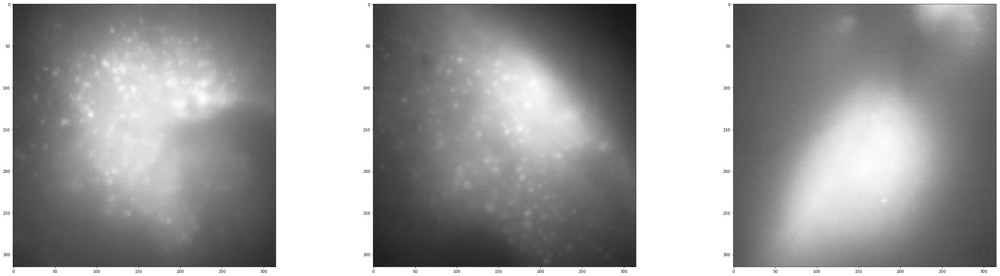

In [635]:
mipList = [item for item in locate('MAX*1.tif','/media/alireza_chenani/dataWork/stress_project/315_stress_week/')]
f,(ax,bx,cx) = plt.subplots(1,3,figsize=[40,10])
ax.imshow(io.imread(mipList[0]),cmap='Greys_r')
bx.imshow(io.imread(mipList[1]),cmap='Greys_r')
cx.imshow(io.imread(mipList[2]),cmap='Greys_r')
plt.tight_layout()

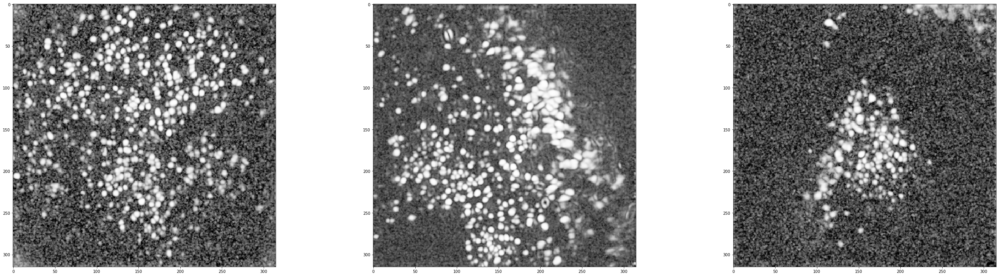

In [645]:
baseFolder = '/media/alireza_chenani/dataWork/stress_project/315_stress_week/'
tiffList = sorted([item for item in locate('C*01.tif',baseFolder)])
stack = np.array([io.imread(tif).T for tif in tiffList])
f,axarr = plt.subplots(1,3,figsize=[40,10])
for (ax,img) in zip(axarr,stack):
    ax.imshow(img,cmap='Greys_r')
plt.tight_layout()


# Local Correlation Maps

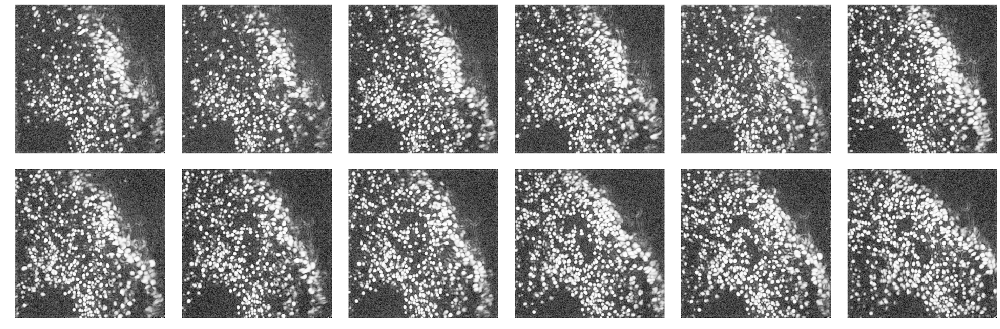

In [654]:
baseFolder = '/media/alireza_chenani/dataWork/stress_project/315_stress_week/BL6-115/'
tiffList = sorted([item for item in locate('C*.tif',baseFolder)])
stack = np.array([io.imread(tif).T for tif in tiffList])
f,axarr = plt.subplots(2,6,figsize=[30,10])
for _ii,img in enumerate(stack[:-1]):
    ax = axarr.flatten()[_ii]
    ax.imshow(img,cmap='Greys_r')
    ax.axis('off')
plt.tight_layout()

# StackReg
pyStackreg is a python wrapper for java based ImageJ plugin StackReg

First you need to initialize the stackReg object.

In [655]:
sr = pystackreg.StackReg(pystackreg.StackReg.RIGID_BODY)

Then register each frame to the previous (already registered) one.
this is what the original StackReg ImageJ plugin uses

In [656]:
RegStack = sr.register_transform_stack(stack, reference='previous')

In [660]:
# r, g, and b are 512x512 float arrays with values >= 0 and < 1.
rChannel = RegStack[-3]
gChanel = RegStack[-2]
bChannel = RegStack[-1]
rgbArray = np.zeros((315,315,3), 'uint8')
rgbArray[..., 0] = rChannel*(rChannel>0.64)*256
rgbArray[..., 1] = gChanel*(gChanel>0.64)*256
rgbArray[..., 2] = bChannel*(bChannel>0.64)*256
img = Image.fromarray(rgbArray)

#plt.imshow(,alpha=0.1,cmap='Reds')

(-0.5, 314.5, 314.5, -0.5)

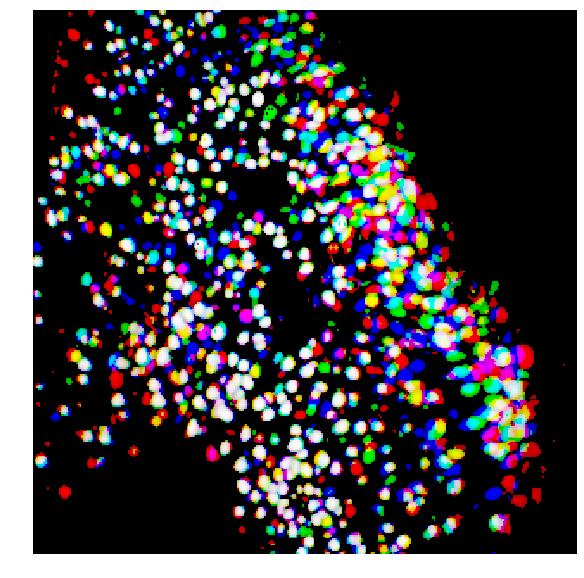

In [663]:
plt.figure(figsize=[10,10])
plt.imshow(rgbArray)
plt.axis('off')

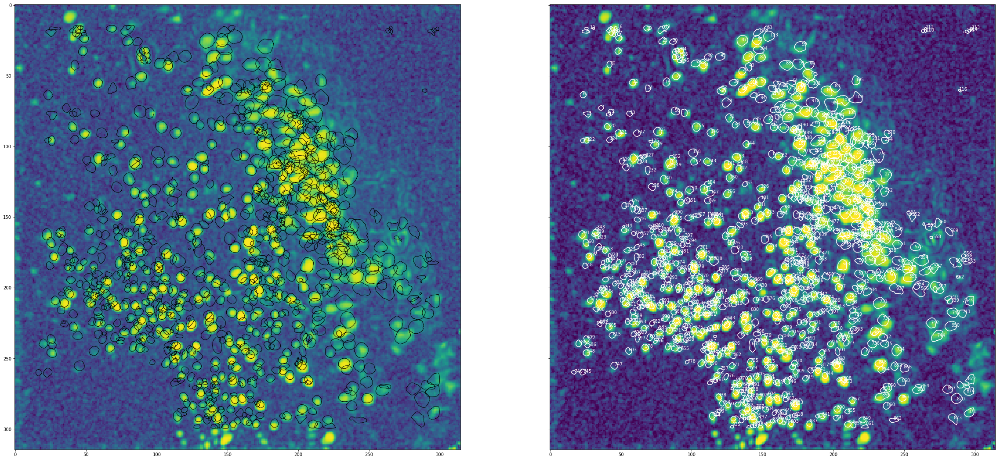

In [464]:
f,(ax,bx) = plt.subplots(1,2,figsize=[40,80],sharex=True,sharey=True)
A = cnmr.get_A_sparse(resultList[0])
contours = cnmr.get_contours(A,nrgthr=0.75)
ax.imshow(stack[0])
#bx.imshow(stack[0].T)
for cont in contours:
    ax.plot(cont[:,0],cont[:,1],'k',lw=1)
cm.utils.visualization.plot_contours(A,stack[0],thr_method='nrg',maxthr=0.32,nrgthr=0.5,ax=bx);
#bx.set_xlim(100,150)

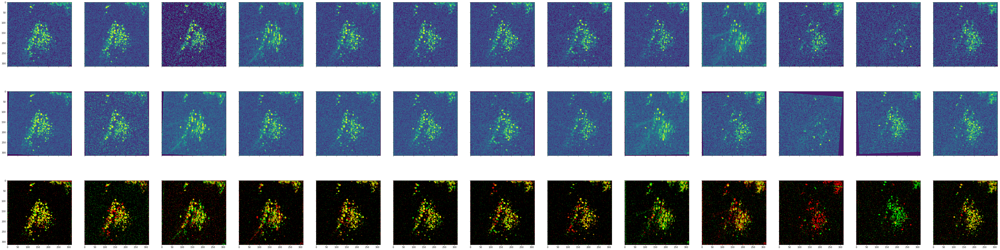

In [590]:
sr = pystackreg.StackReg(pystackreg.StackReg.RIGID_BODY)
f,axarr = plt.subplots(3,(len(stack)-1),figsize=[80,21],sharex=True,sharey=True)
for _ii,item in enumerate(stack[:-1]):
    out_previous = sr.register_transform_stack(stack[_ii:_ii+2], reference='first')
    ax = axarr[0,_ii]
    bx = axarr[1,_ii]
    cx = axarr[2,_ii]
    #print(len(out_previous))
    ax.imshow(out_previous[0])
    bx.imshow(out_previous[1])
    rChannel = out_previous[0]
    gChanel = out_previous[1]
    rgbArray = np.zeros((315,315,3), 'uint8')
    rgbArray[..., 0] = rChannel*(rChannel>0.4)*256
    rgbArray[..., 1] = gChanel*(gChanel>0.4)*256
    img = Image.fromarray(rgbArray)
    cx.imshow(rgbArray)
    ax.set_aspect(1.0)
#axarr[1,6].set_aspect(1.0)

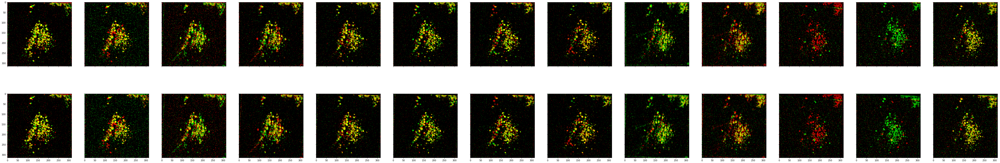

In [588]:
sr = pystackreg.StackReg(pystackreg.StackReg.RIGID_BODY)
RegStack = sr.register_transform_stack(stack, reference='previous')
f,axarr = plt.subplots(2,(len(stack)-1),figsize=[80,14],sharex=True,sharey=True)
for _ii,item in enumerate(stack[:-1]):
    out_previous = sr.register_transform_stack(stack[_ii:_ii+2], reference='first')
    ax = axarr[0,_ii]
    bx = axarr[1,_ii]
    rChannel = out_previous[0]
    gChanel = out_previous[1]
    rgbArray = np.zeros((315,315,3), 'uint8')
    rgbArray[..., 0] = rChannel*(rChannel>0.4)*256
    rgbArray[..., 1] = gChanel*(gChanel>0.4)*256
    img = Image.fromarray(rgbArray)
    ax.imshow(rgbArray)
    ###############################
    rChannel = RegStack[_ii]
    gChanel = RegStack[_ii+1]
    rgbArray = np.zeros((315,315,3), 'uint8')
    rgbArray[..., 0] = rChannel*(rChannel>0.4)*256
    rgbArray[..., 1] = gChanel*(gChanel>0.4)*256
    img = Image.fromarray(rgbArray)
    bx.imshow(rgbArray)
    ax.set_aspect(1.0)
#axarr[1,6].set_aspect(1.0)

In [665]:
tiffM111 = sorted([item for item in locate('C*.tif','/media/alireza_chenani/dataWork/stress_project/315_stress_week/BL6-111/')])
tiffM115 = sorted([item for item in locate('C*.tif','/media/alireza_chenani/dataWork/stress_project/315_stress_week/BL6-115/')])
tiffM215 = sorted([item for item in locate('C*.tif','/media/alireza_chenani/dataWork/stress_project/315_stress_week/BL6-215/')])
M111 = np.array([io.imread(tif).T for tif in tiffM111])
M115 = np.array([io.imread(tif).T for tif in tiffM115])
M215 = np.array([io.imread(tif).T for tif in tiffM215])

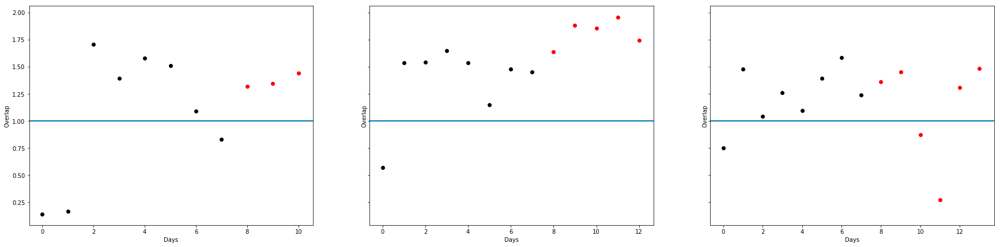

In [669]:
f,axarr = plt.subplots(1,3,figsize=[30,7],sharey=True)
Randsin = np.random.rand(100)/4
for (ax,stack) in zip(axarr,[M111,M115,M215]):
    RegStack = sr.register_transform_stack(stack, reference='previous')
    for _ii,img in enumerate(RegStack):
        prevImg = RegStack[_ii-1]
        temp1 = prevImg*(prevImg>np.quantile(prevImg,0.9))
        temp2 = img*(img>np.quantile(img,0.9))
        overlap =  np.nansum((temp1*temp2))/np.nansum((temp1*temp1))#np.nansum((temp1*temp2)/(temp1*temp1))
        ov = []
        for sin in Randsin:
            R = np.array([[1-sin**2, -1*sin, 0],            [sin,    1-sin**2, 0],            [0,     0,         1]])
            Rimg = sr.transform(prevImg,tmat=R)
            tempR = Rimg*(Rimg>np.quantile(prevImg,0.9))
            ov.append(np.nansum((temp1*tempR))/np.nansum((temp1*temp1)))
        Thr = np.quantile(ov,0.95)
        if _ii<8:
            CLR = 'k'
        else:
            CLR = 'r'
        ax.scatter(_ii,overlap/Thr,c=CLR)
        ax.axhline(1)
        ax.set_xlabel('Days')
        ax.set_ylabel('Overlap')
#plt.xlim(.5,14.5)
#plt.ylim(.9,8012.5)


In [679]:
TrMatrix = sr.register_stack(M115[5:7], reference='first')
out_previous = sr.register_transform_stack(M115[5:7], reference='first')
resultList = sorted([item for item in locate('analysis_results.hdf5','/media/alireza_chenani/dataWork/stress_project/315_stress_week/BL6-115/')])
################################################
RefIdx = 0
bkgIdx = 1
ARef = cnmr.get_A_sparse(resultList[5])
contours = cnmr.get_contours(ARef,nrgthr=0.85)
cont = contours[1254]
cellContour = np.append(cont,np.zeros([cont.shape[0],1]),1).reshape(-1,3)
######################################################

# Reliability Check

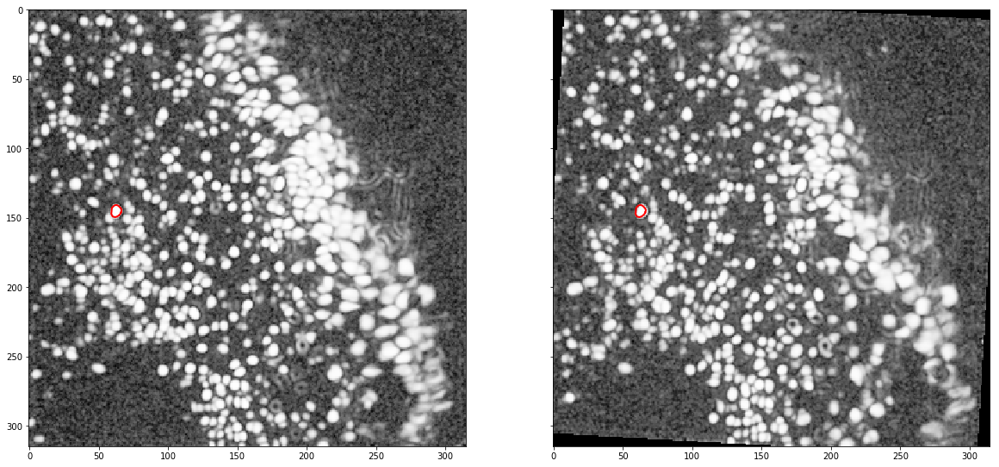

In [681]:
f,(ax,bx) = plt.subplots(1,2,figsize=[20,10],sharex=True,sharey=True)
ax.imshow(out_previous[RefIdx],cmap='Greys_r',)
bx.imshow(out_previous[bkgIdx],cmap='Greys_r',)
for _ii,Mx in enumerate(TrMatrix[:]):
    newCoord = np.dot(cellContour,TrMatrix[0])
    for _jj in range(_ii):
        newCoord = np.dot(newCoord,TrMatrix[_jj])
    newCont = np.dot(cellContour,Mx)
    if _ii==bkgIdx:
        bx.plot(newCoord[:,0],newCoord[:,1],lw=2,c='r')
    if _ii==RefIdx:
        ax.plot(cont[:,0],cont[:,1],lw=2,c='r')

Text(0, 0.5, 'Overlap')

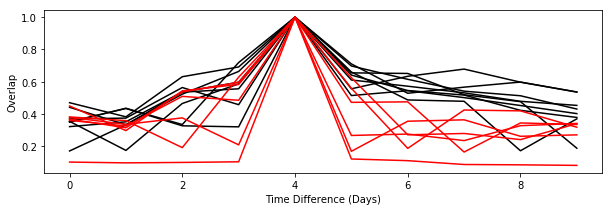

In [687]:
RegStack = sr.register_transform_stack(M215, reference='previous')
plt.figure(figsize=[10,3])
for _ii,img in enumerate(RegStack):
    ov = []
    for distance in [-5,-4-3,-2,-1,0,1,2,3,4,5]:
        if (_ii+distance) > (len(RegStack)-1):
            prevImg = RegStack[_ii+distance - len(RegStack)]
        else:
            prevImg = RegStack[_ii+distance]
        temp1 = prevImg*(prevImg>np.quantile(prevImg,0.9))
        temp2 = img*(img>np.quantile(img,0.9))
        overlap =  np.nansum((temp1*temp2))/np.nansum((temp1*temp1))#np.nansum((temp1*temp2)/(temp1*temp1))
        ov.append(overlap)
    if _ii<8:
        CLR = 'k'
    else:
        CLR = 'r'
    if _ii > -1:#in [1,2,8,9]:
        plt.plot(ov,c=CLR)
plt.xlabel('Time Difference (Days)')
plt.ylabel('Overlap')

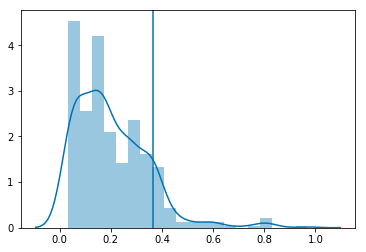

In [550]:
sns.distplot(ov)
plt.axvline(np.quantile(ov,0.9))

In [548]:
np.nansum((temp1*temp2))/np.nansum((temp1*temp1))

0.7806665

In [546]:
315*315

99225